# Importing necessary modules

In [1]:
import os
import pathlib
import numpy as np
import pandas as pd
from tqdm import tqdm
import time

import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
import torchvision
import torchvision.transforms as transforms
from sklearn.metrics import recall_score, precision_score, f1_score

!pip install efficientnet_pytorch
from efficientnet_pytorch import EfficientNet
import torch.nn.functional as F

import torchvision.models as models
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

  Preparing metadata (setup.py) ... done
  Created wheel for efficientnet_pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16446 sha256=9a6cd37b3c56707ad750449506552ad597298e35603240b132dbf8f921e5f35f
  Stored in directory: /root/.cache/pip/wheels/0e/cc/b2/49e74588263573ff778da58cc99b9c6349b496636a7e165be6
Successfully built efficientnet_pytorch


In [2]:
torch.manual_seed(42) 
torch.cuda.manual_seed_all(42) 
torch.backends.cudnn.deterministic=True
torch.backends.cudnn.benchmark=False

# Preparing the datasets

In [3]:
train_list = []
train_labels = []

train_pos_path = pathlib.Path(r'../input/surface-crack/train/Positive')
train_pos_list = ([str(path) for path in train_pos_path.glob('*.jpg')])
train_list.extend(train_pos_list)
train_labels.extend([1] * len(train_pos_list))

train_neg_path = pathlib.Path(r'../input/surface-crack/train/Negative')
train_neg_list = ([str(path) for path in train_neg_path.glob('*.jpg')])
train_list.extend(train_neg_list)
train_labels.extend([0] * len(train_neg_list))

In [4]:
test_list = []
test_labels = []

test_pos_path = pathlib.Path(r'../input/surface-crack/test/Positive')
test_pos_list = ([str(path) for path in test_pos_path.glob('*.jpg')])
test_list.extend(test_pos_list)
test_labels.extend([1] * len(test_pos_list))

test_neg_path = pathlib.Path(r'../input/surface-crack/test/Negative')
test_neg_list = ([str(path) for path in test_neg_path.glob('*.jpg')])
test_list.extend(test_neg_list)
test_labels.extend([0] * len(test_neg_list))

In [5]:
valid_list = []
valid_labels = []

valid_pos_path = pathlib.Path(r'../input/surface-crack/valid/Positive')
valid_pos_list = ([str(path) for path in valid_pos_path.glob('*.jpg')])
valid_list.extend(valid_pos_list)
valid_labels.extend([1] * len(valid_pos_list))

valid_neg_path = pathlib.Path(r'../input/surface-crack/valid/Negative')
valid_neg_list = ([str(path) for path in valid_neg_path.glob('*.jpg')])
valid_list.extend(valid_neg_list)
valid_labels.extend([0] * len(valid_neg_list))

## Custom Dataset

In [6]:
class CrackDataset(Dataset):
    def __init__(self, file_list, labels, transform=None):
        self.file_list = file_list
        self.labels = labels
        self.transform = transform
    def __getitem__(self, index):
        img = Image.open(self.file_list[index])        
        if self.transform is not None:
            img = self.transform(img)
        label = self.labels[index]
        return img, label
    def __len__(self):
        return len(self.labels)

## Required transforms

In [7]:
mean=[0.485, 0.456, 0.406]
std=[0.229, 0.224, 0.225]

train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225])
])

test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

In [8]:
BATCH_SIZE = 16

train_ds = CrackDataset(train_list, train_labels, train_transform)
valid_ds = CrackDataset(valid_list, valid_labels, test_transform)
test_ds = CrackDataset(test_list, test_labels, test_transform)

train_dl = DataLoader(train_ds, BATCH_SIZE, shuffle=True)
valid_dl = DataLoader(valid_ds, BATCH_SIZE, shuffle=True)
test_dl = DataLoader(test_ds, BATCH_SIZE, shuffle=True)

## Plotting Training Examples

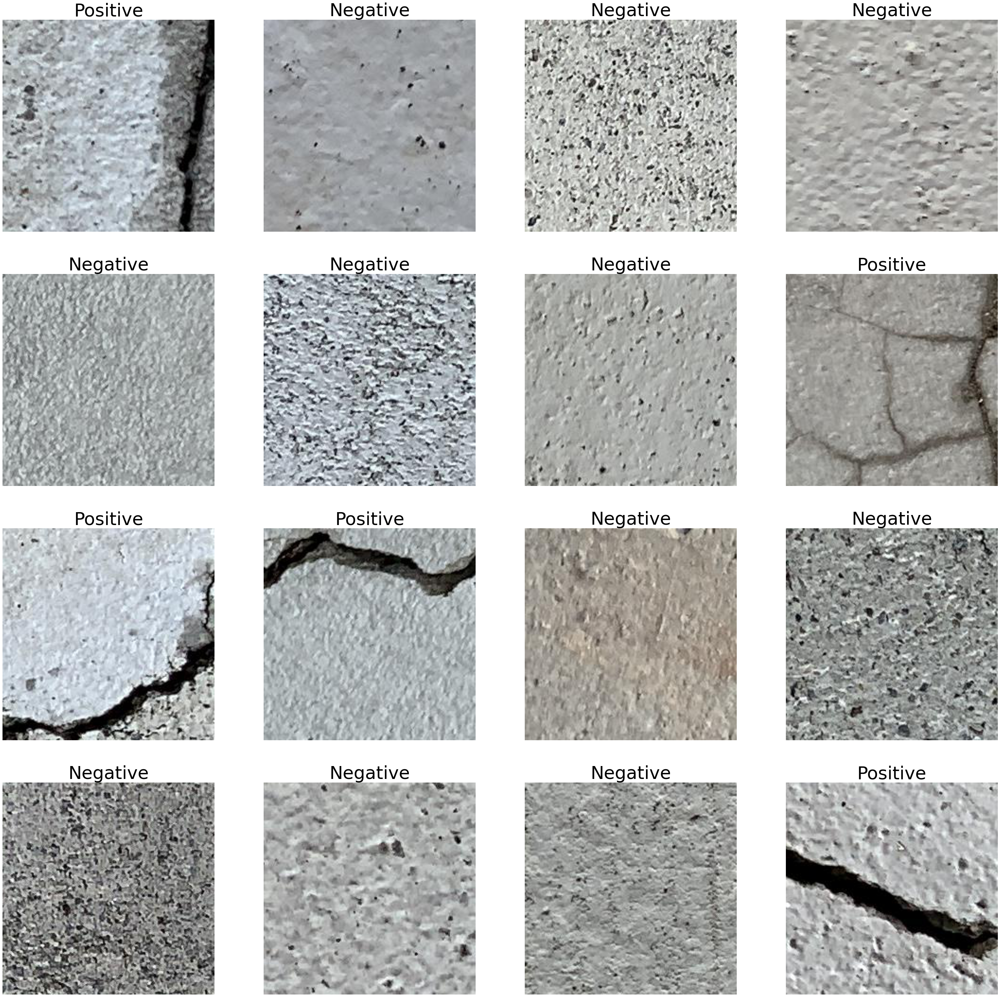

In [9]:
data, target = next(iter(train_dl))
f, axarr = plt.subplots(4,len(target) // 4, figsize=(50, 50))
for i in range(4):
    for j in range(4):
        k = i * 4 + j
        axarr[i, j].set_title("Positive" if target[k] else "Negative", fontsize=50, pad=10)
        axarr[i, j].imshow(data[k].permute(1, 2, 0).numpy() * std + mean)
        axarr[i, j].axis('off')

In [10]:
len(train_ds), len(valid_ds), len(test_ds)

(600, 200, 200)

# EfficientNet Model for Transfer Learning

In [11]:
class CrackDetectionModel(nn.Module):
    def __init__(self, eff_name = 'efficientnet-b0', num_classes = 1):
        super().__init__()
        self.pre_trained = EfficientNet.from_pretrained(eff_name)
        in_features = getattr(self.pre_trained,'_fc').in_features
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.classifier = nn.Sequential(nn.Linear(in_features, in_features//2), nn.ReLU(),
                                       nn.Linear(in_features//2, in_features//4), nn.ReLU(),
                                       nn.Linear(in_features//4, num_classes))
    
    def forward(self, x):
        
        
        x = self.pre_trained.extract_features(x)
        x = self.pool(x)
        x = x.view(x.size(0),-1)
        classifier_out = self.classifier(x) 
        
        return classifier_out

## Training the model

In [12]:
NUM_EPOCHS = 15
device = ('cuda' if torch.cuda.is_available() else 'cpu')

model = CrackDetectionModel()
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(
        model.parameters(), lr=0.001, amsgrad=True)

Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b0-355c32eb.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b0-355c32eb.pth


  0%|          | 0.00/20.4M [00:00<?, ?B/s]

Loaded pretrained weights for efficientnet-b0


In [13]:
def train(model, num_epochs, train_dl, valid_dl):
    model.to(device)
    loss_hist_train = [0] * num_epochs
    accuracy_hist_train = [0] * num_epochs
    loss_hist_valid = [0] * num_epochs
    accuracy_hist_valid = [0] * num_epochs
    for epoch in range(num_epochs):
        model.train()
        for x_batch, y_batch in train_dl:
            x_batch = x_batch.to(device, dtype=torch.float) 
            y_batch = y_batch.to(device, dtype=torch.float) 
            pred = model(x_batch).squeeze()
            loss = criterion(pred, y_batch.float())
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
            loss_hist_train[epoch] += loss.item()*y_batch.size(0)
            is_correct = ((pred>=0.0).float() == y_batch).float()
            accuracy_hist_train[epoch] += is_correct.sum().cpu()

        loss_hist_train[epoch] /= len(train_dl.dataset)
        accuracy_hist_train[epoch] /= len(train_dl.dataset)
        
        model.eval()
        with torch.no_grad():
            for x_batch, y_batch in valid_dl:
                x_batch = x_batch.to(device, dtype=torch.float) 
                y_batch = y_batch.to(device, dtype=torch.float) 
                pred = model(x_batch).squeeze()
                loss = criterion(pred, y_batch.float())
                loss_hist_valid[epoch] += loss.item()*y_batch.size(0) 
                is_correct = ((pred>=0.0).float() == y_batch).float()
                accuracy_hist_valid[epoch] += is_correct.sum().cpu()

        loss_hist_valid[epoch] /= len(valid_dl.dataset)
        accuracy_hist_valid[epoch] /= len(valid_dl.dataset)
        
        print(f'Epoch {epoch+1}  Loss: {loss_hist_train[epoch]:.4f} Accuracy: {accuracy_hist_train[epoch] * 100:.2f}  Validation_Loss: {loss_hist_valid[epoch]:.4f} Validation_Accuracy: {accuracy_hist_valid[epoch] * 100:.2f}')
    return loss_hist_train, loss_hist_valid, accuracy_hist_train, accuracy_hist_valid

In [14]:
start = time.time()
hist = train(model, NUM_EPOCHS, train_dl, valid_dl)
end = time.time()
print()
print("Total time taken to train: ", end-start, " secs")

Epoch 1  Loss: 0.2391 Accuracy: 90.17  Validation_Loss: 0.3216 Validation_Accuracy: 85.50
Epoch 2  Loss: 0.0871 Accuracy: 96.67  Validation_Loss: 0.0205 Validation_Accuracy: 99.50
Epoch 3  Loss: 0.0247 Accuracy: 99.17  Validation_Loss: 0.4489 Validation_Accuracy: 89.50
Epoch 4  Loss: 0.0324 Accuracy: 99.33  Validation_Loss: 0.0612 Validation_Accuracy: 98.00
Epoch 5  Loss: 0.0846 Accuracy: 97.33  Validation_Loss: 0.3287 Validation_Accuracy: 94.50
Epoch 6  Loss: 0.0906 Accuracy: 97.83  Validation_Loss: 0.0673 Validation_Accuracy: 97.00
Epoch 7  Loss: 0.0822 Accuracy: 97.67  Validation_Loss: 0.1892 Validation_Accuracy: 97.50
Epoch 8  Loss: 0.0222 Accuracy: 99.17  Validation_Loss: 0.1870 Validation_Accuracy: 96.00
Epoch 9  Loss: 0.1305 Accuracy: 97.33  Validation_Loss: 0.1965 Validation_Accuracy: 88.00
Epoch 10  Loss: 0.0507 Accuracy: 98.83  Validation_Loss: 0.1060 Validation_Accuracy: 98.50
Epoch 11  Loss: 0.0674 Accuracy: 97.67  Validation_Loss: 0.0806 Validation_Accuracy: 99.00
Epoch 12

## Plotting the learning curve

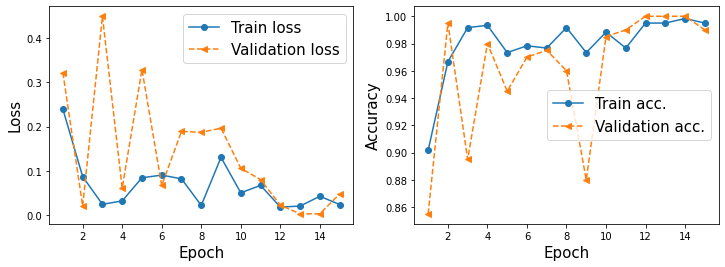

In [15]:
x_arr = np.arange(len(hist[0])) + 1

fig = plt.figure(figsize=(12, 4))
ax = fig.add_subplot(1, 2, 1)
ax.plot(x_arr, hist[0], '-o', label='Train loss')
ax.plot(x_arr, hist[1], '--<', label='Validation loss')
ax.legend(fontsize=15)
ax.set_xlabel('Epoch', size=15)
ax.set_ylabel('Loss', size=15)

ax = fig.add_subplot(1, 2, 2)
ax.plot(x_arr, hist[2], '-o', label='Train acc.')
ax.plot(x_arr, hist[3], '--<', label='Validation acc.')
ax.legend(fontsize=15)
ax.set_xlabel('Epoch', size=15)
ax.set_ylabel('Accuracy', size=15)

#plt.savefig('./lr_curve.png', dpi=300)
plt.show()

In [16]:
# Saving the model
torch.save(model, "./model.pt")

## Inference on Test Set

In [17]:
def inference(model, test_dl):
    correct_prediction = 0
    total_prediction = 0
    targets = []
    predictions = []
    # Disable gradient updates
    with torch.inference_mode():
        for data in test_dl:
            # Get the input features and target labels, and put them on the GPU
            inputs, labels = data[0].to(device, dtype=torch.float), data[1].to(
                device, dtype=torch.float
            )

            # Get predictions
            output = model(inputs).squeeze()

            # Get the predicted class with the highest score
            prediction = (output >= 0)
            # Count of predictions that matched the target label
            correct_prediction += (prediction == labels).sum().item()
            total_prediction += prediction.shape[0]
            
            predictions.append(prediction.cpu())
            targets.append(labels.cpu())
    predictions = torch.concat(predictions)
    targets = torch.concat(targets)
    
    acc = correct_prediction / total_prediction
    precision = precision_score(targets, predictions)
    recall = recall_score(targets, predictions)
    f1 = f1_score(targets, predictions)
    print(f"Precision: {precision}")
    print(f"Recall: {recall}")
    print(f"F1: {f1}")
    print(f"Accuracy: {acc * 100:.3f}\n")
    print(f"Total items: {total_prediction}")

In [18]:
print("Testing Metrics: \n")
inference(model, test_dl)

Testing Metrics: 

Precision: 1.0
Recall: 1.0
F1: 1.0
Accuracy: 100.000

Total items: 200


## Plotting Testing Examples with Predicted Labels

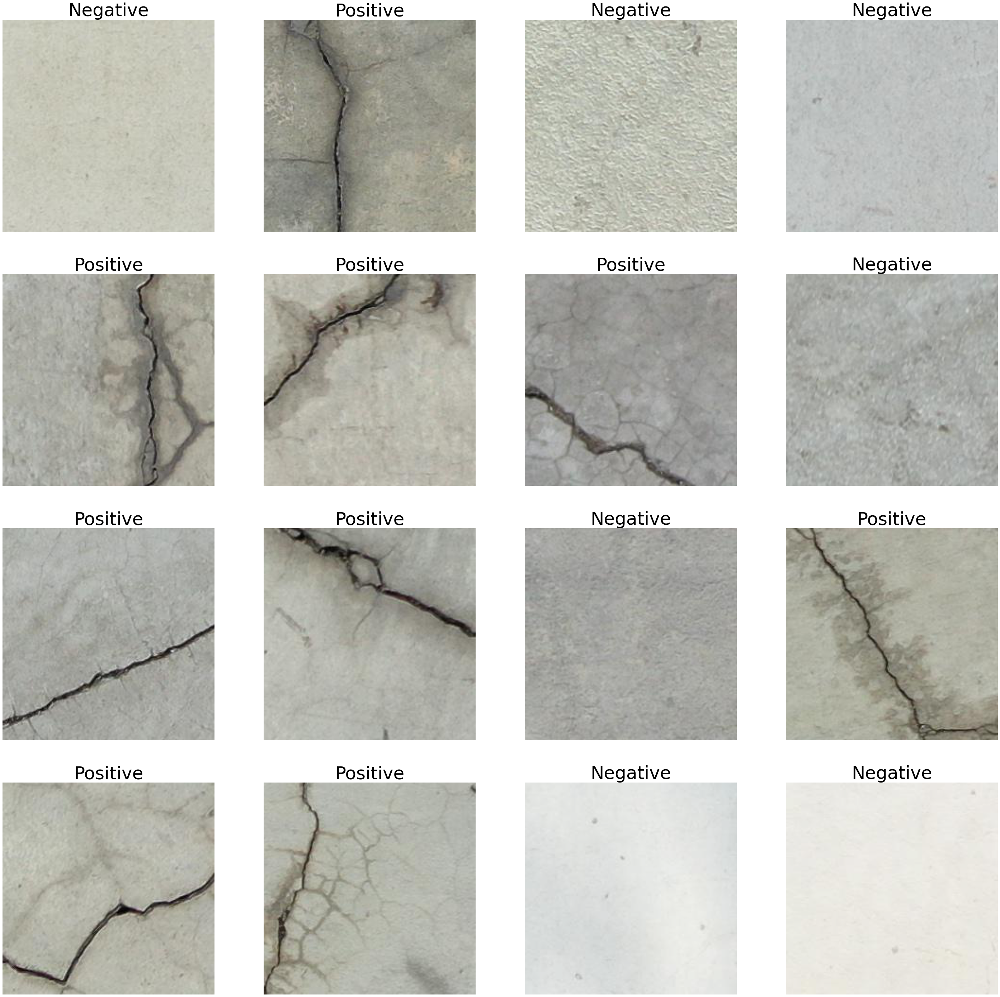

In [19]:
data, target = next(iter(test_dl))
model.to("cpu")
pred = (model(data).squeeze() >= 0)
f, axarr = plt.subplots(4,len(target) // 4, figsize=(50, 50))
for i in range(4):
    for j in range(4):
        k = i * 4 + j
        axarr[i, j].set_title("Positive" if pred[k] else "Negative", fontsize=50, pad=10)
        axarr[i, j].imshow(data[k].permute(1, 2, 0).numpy() * std + mean)
        axarr[i, j].axis('off')